### USA Accidents Dataset Exploratory Data Analysis

Todo - Talk about EDA

What it contains, how it will be useful:
 - Kaggle
 - Information about accidents in US
 - Can useful to prevent accidents
 - mention that this subset(last 3 year) of original data does not contain any data about New York City

In [86]:
# Import Packages needed for EDA
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Folium is a powerful Python library that helps you create several types of Leaflet maps. By default, Folium creates a map in a separate HTML file.
import folium
from folium.plugins import HeatMap

%matplotlib inline


### Download dataset from Kaggles through api

* Below command will download the zip file from Kaggle
* !kaggle datasets download -d sobhanmoosavi/us-accidents

* This tooo longer time so we have downloaded it manually

* Install Kaggle
* !pip install kaggle

In [3]:
# Load data into pandas DataFrame
# Commenting below code so we don't run the cell accidently
# original_df = pd.read_csv('/Users/samirul/Codes/python/ML/Projects/us-accident-eda/US_Accidents_March23.csv',low_memory=False)

In [20]:
original_df.Start_Time = pd.to_datetime(original_df.Start_Time ,format='mixed')

In [21]:
original_df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,0.01,...,False,False,False,False,True,False,Night,Night,Day,Day
3,A-4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,NaN,NaN,0.01,...,False,False,False,False,False,False,Night,Day,Day,Day
4,A-5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,NaN,NaN,0.01,...,False,False,False,False,True,False,Day,Day,Day,Day


In [22]:
original_df=original_df.sort_values(by = 'Start_Time')

In [24]:
original_df.Start_Time.dt.year.unique()

array([2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023], dtype=int32)

In [36]:
# Create last three years data of Us accidents
df_2021_2023 = original_df[original_df['Start_Time'].dt.year >= 2021 ]

In [37]:
# Lets Export this so in future we can ignore importing the large dataset
df_2021_2023.to_csv('/Users/samirul/Codes/python/ML/Projects/us-accident-eda/US_Accidents_2021_2023.csv', index=False)

In [38]:
# Now lets reimport the dataset

df = pd.read_csv('US_Accidents_2021_2023.csv')

In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3572838 entries, 0 to 3572837
Data columns (total 46 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Source                 object 
 2   Severity               int64  
 3   Start_Time             object 
 4   End_Time               object 
 5   Start_Lat              float64
 6   Start_Lng              float64
 7   End_Lat                float64
 8   End_Lng                float64
 9   Distance(mi)           float64
 10  Description            object 
 11  Street                 object 
 12  City                   object 
 13  County                 object 
 14  State                  object 
 15  Zipcode                object 
 16  Country                object 
 17  Timezone               object 
 18  Airport_Code           object 
 19  Weather_Timestamp      object 
 20  Temperature(F)         float64
 21  Wind_Chill(F)          float64
 22  Humidity(%)       

In [40]:
df.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,3.572838e+06,3.572838e+06,3.572838e+06,2.886571e+06,2.886571e+06,3.572838e+06,3.495924e+06,3.467885e+06,3.491014e+06,3.506127e+06,3.491707e+06,3.478433e+06,3.431551e+06
mean,2.098091e+00,3.594332e+01,-9.384307e+01,3.589383e+01,-9.424218e+01,8.291773e-01,6.170081e+01,6.037489e+01,6.394055e+01,2.935604e+01,9.063743e+00,7.419336e+00,5.733836e-03
std,3.939835e-01,5.207021e+00,1.741426e+01,5.305912e+00,1.771758e+01,1.922402e+00,1.956567e+01,2.182927e+01,2.288597e+01,1.121810e+00,2.517358e+00,5.519269e+00,5.178085e-02
min,1.000000e+00,2.455480e+01,-1.245481e+02,2.456601e+01,-1.245457e+02,0.000000e+00,-4.500000e+01,-6.900000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.000000e+00,3.295150e+01,-1.171054e+02,3.289484e+01,-1.172579e+02,3.600000e-02,4.900000e+01,4.800000e+01,4.700000e+01,2.918000e+01,1.000000e+01,3.000000e+00,0.000000e+00
50%,2.000000e+00,3.579943e+01,-8.616454e+01,3.584912e+01,-8.604664e+01,2.120000e-01,6.400000e+01,6.400000e+01,6.600000e+01,2.970000e+01,1.000000e+01,7.000000e+00,0.000000e+00
75%,2.000000e+00,3.997059e+01,-8.020375e+01,3.995475e+01,-8.016612e+01,8.880000e-01,7.700000e+01,7.700000e+01,8.300000e+01,2.996000e+01,1.000000e+01,1.000000e+01,0.000000e+00
max,4.000000e+00,4.900050e+01,-6.755331e+01,4.900222e+01,-6.851089e+01,3.365700e+02,2.070000e+02,2.070000e+02,1.000000e+02,5.863000e+01,1.400000e+02,1.087000e+03,3.647000e+01


In [41]:
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-6925260,Source1,2,2021-01-01 00:00:00,2021-01-01 01:38:42,30.384298,-91.064819,30.387228,-91.063037,0.229,...,False,False,False,False,True,False,Night,Night,Night,Night
1,A-6641766,Source1,2,2021-01-01 00:00:01,2021-01-01 01:22:27,35.901771,-78.656364,35.901859,-78.656819,0.026,...,False,False,True,False,False,False,Night,Night,Night,Night
2,A-6948267,Source1,2,2021-01-01 00:00:01,2021-01-01 01:22:27,35.901771,-78.656364,35.901859,-78.656819,0.026,...,False,False,True,False,False,False,Night,Night,Night,Night
3,A-6775069,Source1,2,2021-01-01 00:00:01,2021-01-01 01:36:56,32.559486,-96.822895,32.547140,-96.822416,0.853,...,False,False,False,False,False,False,Night,Night,Night,Night
4,A-6968205,Source1,2,2021-01-01 00:01:00,2021-01-01 01:40:14,38.018757,-121.947351,38.018747,-121.941681,0.309,...,False,False,False,False,False,False,Night,Night,Night,Night


In [42]:
df.columns

Index(['ID', 'Source', 'Severity', 'Start_Time', 'End_Time', 'Start_Lat',
       'Start_Lng', 'End_Lat', 'End_Lng', 'Distance(mi)', 'Description',
       'Street', 'City', 'County', 'State', 'Zipcode', 'Country', 'Timezone',
       'Airport_Code', 'Weather_Timestamp', 'Temperature(F)', 'Wind_Chill(F)',
       'Humidity(%)', 'Pressure(in)', 'Visibility(mi)', 'Wind_Direction',
       'Wind_Speed(mph)', 'Precipitation(in)', 'Weather_Condition', 'Amenity',
       'Bump', 'Crossing', 'Give_Way', 'Junction', 'No_Exit', 'Railway',
       'Roundabout', 'Station', 'Stop', 'Traffic_Calming', 'Traffic_Signal',
       'Turning_Loop', 'Sunrise_Sunset', 'Civil_Twilight', 'Nautical_Twilight',
       'Astronomical_Twilight'],
      dtype='object')

In [43]:
# Check how many Numeric columns are there in the Dataframe

numerics = ['int64' ,'int16','int32','float64','float16','float32']
numeric_df = df.select_dtypes(include=numerics)
len(numeric_df.columns)

13

In [45]:
# Check for missing values 
missing_values = df.isna().sum().sort_values(ascending=False)
missing_values

End_Lat                  686267
End_Lng                  686267
Precipitation(in)        141287
Wind_Chill(F)            104953
Wind_Direction            94421
Wind_Speed(mph)           94405
Humidity(%)               81824
Visibility(mi)            81131
Weather_Condition         77630
Temperature(F)            76914
Pressure(in)              66711
Weather_Timestamp         59879
Nautical_Twilight         22762
Civil_Twilight            22762
Sunrise_Sunset            22762
Astronomical_Twilight     22762
Airport_Code              13992
Street                    10426
Timezone                   3367
Zipcode                     742
City                        120
Description                   3
Traffic_Signal                0
Roundabout                    0
Station                       0
Stop                          0
Traffic_Calming               0
Country                       0
Turning_Loop                  0
No_Exit                       0
End_Time                      0
Start_Ti

In [46]:
# Percentage of missing values per column
missing_percentages = df.isna().sum().sort_values(ascending=False)/len(df)
missing_percentages

End_Lat                  1.920790e-01
End_Lng                  1.920790e-01
Precipitation(in)        3.954475e-02
Wind_Chill(F)            2.937525e-02
Wind_Direction           2.642745e-02
Wind_Speed(mph)          2.642297e-02
Humidity(%)              2.290168e-02
Visibility(mi)           2.270772e-02
Weather_Condition        2.172783e-02
Temperature(F)           2.152742e-02
Pressure(in)             1.867171e-02
Weather_Timestamp        1.675951e-02
Nautical_Twilight        6.370846e-03
Civil_Twilight           6.370846e-03
Sunrise_Sunset           6.370846e-03
Astronomical_Twilight    6.370846e-03
Airport_Code             3.916215e-03
Street                   2.918128e-03
Timezone                 9.423881e-04
Zipcode                  2.076780e-04
City                     3.358675e-05
Description              8.396686e-07
Traffic_Signal           0.000000e+00
Roundabout               0.000000e+00
Station                  0.000000e+00
Stop                     0.000000e+00
Traffic_Calm

In [47]:
missing_percentages[missing_percentages != 0]

End_Lat                  1.920790e-01
End_Lng                  1.920790e-01
Precipitation(in)        3.954475e-02
Wind_Chill(F)            2.937525e-02
Wind_Direction           2.642745e-02
Wind_Speed(mph)          2.642297e-02
Humidity(%)              2.290168e-02
Visibility(mi)           2.270772e-02
Weather_Condition        2.172783e-02
Temperature(F)           2.152742e-02
Pressure(in)             1.867171e-02
Weather_Timestamp        1.675951e-02
Nautical_Twilight        6.370846e-03
Civil_Twilight           6.370846e-03
Sunrise_Sunset           6.370846e-03
Astronomical_Twilight    6.370846e-03
Airport_Code             3.916215e-03
Street                   2.918128e-03
Timezone                 9.423881e-04
Zipcode                  2.076780e-04
City                     3.358675e-05
Description              8.396686e-07
dtype: float64

<Axes: >

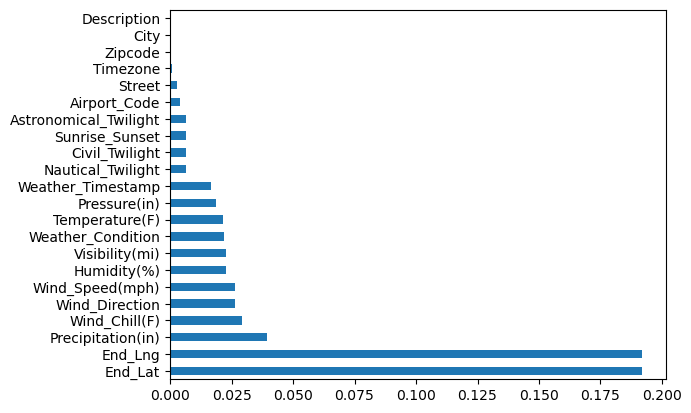

In [48]:
missing_percentages[missing_percentages != 0].plot(kind ='barh')

### From the above data assume:
 * we can remove End_Lng , End_Lat , Wind_chill(F), Precipitation(in) columns 
 * We can fill missing numeric  columns with median

In [49]:
# Let's drop End_Lng , End_Lat , Wind_chill(F), Precipitation(in) columns 
df.drop('End_Lng',axis = 1,inplace=True)
df.drop('End_Lat',axis = 1,inplace=True)
df.drop('Wind_Chill(F)',axis = 1,inplace=True)
df.drop('Precipitation(in)',axis = 1,inplace=True)

In [50]:
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,Street,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-6925260,Source1,2,2021-01-01 00:00:00,2021-01-01 01:38:42,30.384298,-91.064819,0.229,Incident on SIEGEN LN near N RIEGER RD Expect ...,Siegen Ln,...,False,False,False,False,True,False,Night,Night,Night,Night
1,A-6641766,Source1,2,2021-01-01 00:00:01,2021-01-01 01:22:27,35.901771,-78.656364,0.026,Incident on STRICKLAND RD near HOUSE 9600 Driv...,Strickland Rd,...,False,False,True,False,False,False,Night,Night,Night,Night
2,A-6948267,Source1,2,2021-01-01 00:00:01,2021-01-01 01:22:27,35.901771,-78.656364,0.026,Incident on STRICKLAND RD near HOUSE 9600 Driv...,Strickland Rd,...,False,False,True,False,False,False,Night,Night,Night,Night
3,A-6775069,Source1,2,2021-01-01 00:00:01,2021-01-01 01:36:56,32.559486,-96.822895,0.853,Incident on I-35E SB near BEAR CREEK RD Drive ...,S Beckley Rd,...,False,False,False,False,False,False,Night,Night,Night,Night
4,A-6968205,Source1,2,2021-01-01 00:01:00,2021-01-01 01:40:14,38.018757,-121.947351,0.309,Incident on CA-4 EB near BAILEY RD Drive with ...,CA-4 E,...,False,False,False,False,False,False,Night,Night,Night,Night


In [51]:
df.isna().sum().sort_values(ascending=False)/len(df)

Wind_Direction           2.642745e-02
Wind_Speed(mph)          2.642297e-02
Humidity(%)              2.290168e-02
Visibility(mi)           2.270772e-02
Weather_Condition        2.172783e-02
Temperature(F)           2.152742e-02
Pressure(in)             1.867171e-02
Weather_Timestamp        1.675951e-02
Nautical_Twilight        6.370846e-03
Civil_Twilight           6.370846e-03
Sunrise_Sunset           6.370846e-03
Astronomical_Twilight    6.370846e-03
Airport_Code             3.916215e-03
Street                   2.918128e-03
Timezone                 9.423881e-04
Zipcode                  2.076780e-04
City                     3.358675e-05
Description              8.396686e-07
State                    0.000000e+00
Traffic_Calming          0.000000e+00
Roundabout               0.000000e+00
Station                  0.000000e+00
Stop                     0.000000e+00
End_Time                 0.000000e+00
Traffic_Signal           0.000000e+00
Turning_Loop             0.000000e+00
No_Exit     

In [52]:
# Fill Wind_Speed(mph) with its median
df['Wind_Speed(mph)'].fillna(df['Wind_Speed(mph)'].median(),inplace=True)

In [53]:
df['Wind_Speed(mph)'].isna().sum()

0

### Rest of the columns has very few null so we are ignoring those as of now

### Column we analyze:
1. City
2. Start Time
3. Start Lat ,Start Lng
4. Temperature
5. Weather Condition

In [54]:
# Check the City Column
unq_cities = df.City.unique()
len(unq_cities)

11956

In [55]:
# Cities by Accident
cities_by_accident = df.City.value_counts()

In [56]:
cities_by_accident

City
Miami          128627
Orlando         71727
Los Angeles     66000
Houston         56210
Dallas          55086
                ...  
Hanscom Afb         1
Etoile              1
Centerport          1
Wyanet              1
Eleanor             1
Name: count, Length: 11955, dtype: int64

In [57]:
cities_by_accident[:20]

City
Miami           128627
Orlando          71727
Los Angeles      66000
Houston          56210
Dallas           55086
Charlotte        50572
Raleigh          34285
Nashville        31874
Baton Rouge      29775
Sacramento       29252
Austin           27550
San Diego        26824
Atlanta          21869
Phoenix          21595
Richmond         21338
Minneapolis      20620
Tucson           19816
Jacksonville     19144
New Orleans      19095
Kansas City      16777
Name: count, dtype: int64

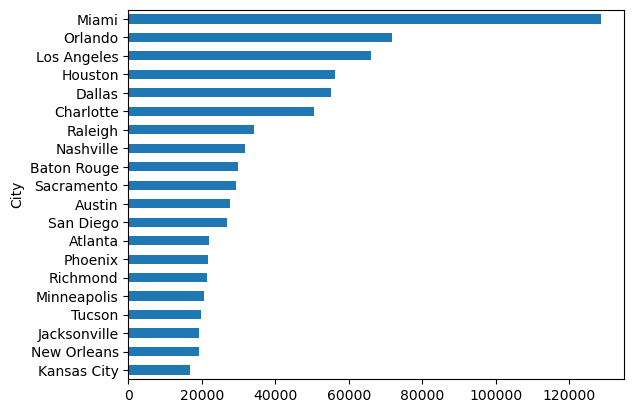

In [58]:
cities_by_accident[:20].sort_values(ascending=True).plot(kind='barh');

In [59]:
# Seems like New York isn't present in the dataframe
"New York" in df.City

False

In [60]:
"NY" in df.State

False

In [61]:
# Set style
sns.set_style("darkgrid")

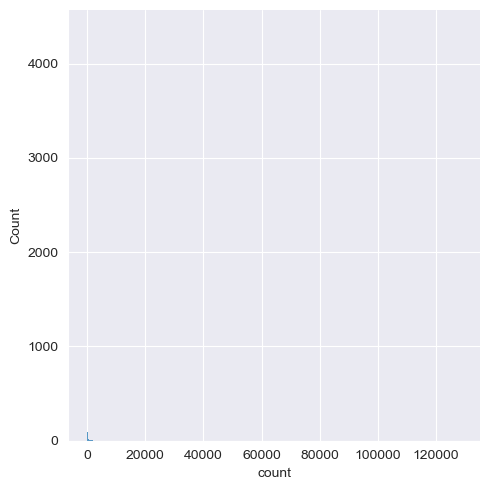

In [62]:
sns.displot(cities_by_accident)

In [63]:
high_accident_cities = cities_by_accident[cities_by_accident >=1000]
low_accident_cities = cities_by_accident[cities_by_accident < 1000]

In [64]:
len(high_accident_cities)/len(cities_by_accident)

0.050439146800501884

<Axes: xlabel='count', ylabel='Count'>

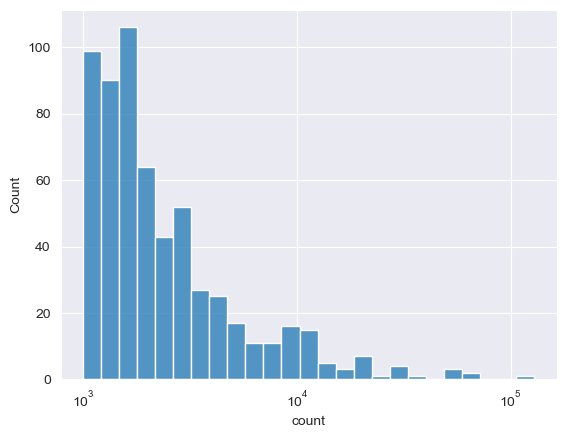

In [66]:
sns.histplot(high_accident_cities, log_scale=True)

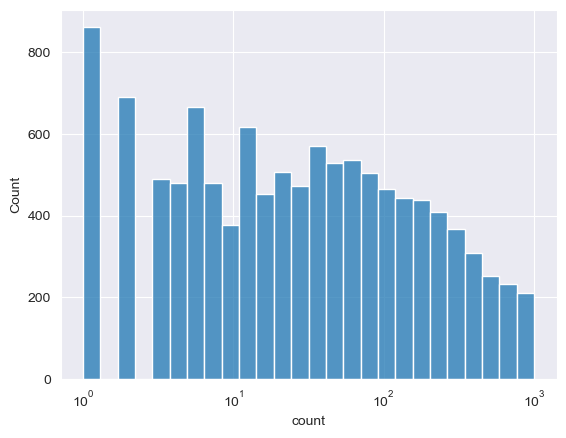

In [67]:
sns.histplot(low_accident_cities,log_scale=True);


In [68]:
cities_by_accident[cities_by_accident == 1]

City
Redgranite        1
Coinjock          1
Robeline          1
Lecontes Mills    1
Mingo             1
                 ..
Hanscom Afb       1
Etoile            1
Centerport        1
Wyanet            1
Eleanor           1
Name: count, Length: 860, dtype: int64

### Now analyze the Start_Time

In [69]:
df["Start_Time"][0]

'2021-01-01 00:00:00'

/var/folders/1q/97slxf2n6bv2jwc9z0pm2jch0000gn/T/ipykernel_1209/2949408260.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df.Start_Time.dt.hour, bins = 24,kde=False, norm_hist=False)


<Axes: xlabel='Start_Time'>

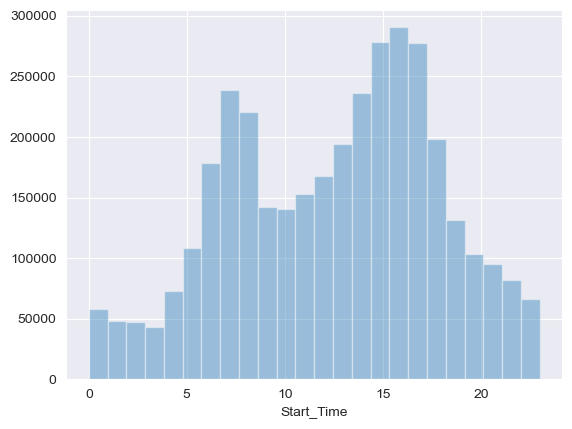

In [71]:
# Plot hour vs percentage of accidents
sns.distplot(df.Start_Time.dt.hour, bins = 24,kde=False, norm_hist=False)

- A high percentage of accidents occur between  6 am to 10 am (probably people in a hurry to get to work)

- Next highest percentage is 2 pm to 6 pm

/var/folders/1q/97slxf2n6bv2jwc9z0pm2jch0000gn/T/ipykernel_1209/2374219404.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df.Start_Time.dt.dayofweek, bins = 7,kde=False, norm_hist=False);


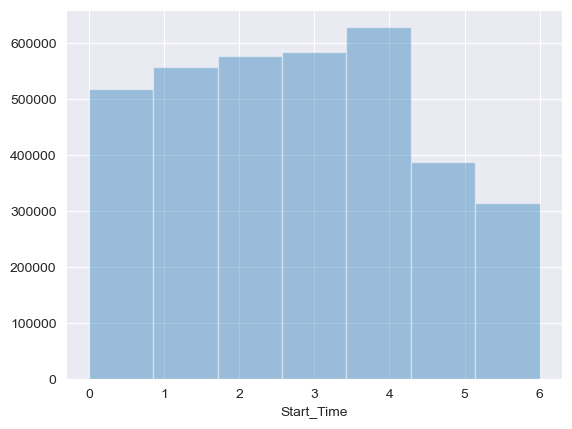

In [72]:
# Now check day vs percentage of accidents
sns.distplot(df.Start_Time.dt.dayofweek, bins = 7,kde=False, norm_hist=False);

Is the distribution of accidents by hour same on weekends as on weekdays.

In [73]:
sundays_start_time = df.Start_Time[df.Start_Time.dt.dayofweek == 6]
sundays_start_time

7780      2021-01-03 00:01:00
7781      2021-01-03 00:01:00
7782      2021-01-03 00:01:34
7783      2021-01-03 00:02:00
7784      2021-01-03 00:02:17
                  ...        
3561460   2023-03-26 23:57:05
3561461   2023-03-26 23:57:05
3561462   2023-03-26 23:57:05
3561463   2023-03-26 23:58:00
3561464   2023-03-26 23:58:00
Name: Start_Time, Length: 315851, dtype: datetime64[ns]

/var/folders/1q/97slxf2n6bv2jwc9z0pm2jch0000gn/T/ipykernel_1209/2370434026.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(sundays_start_time.dt.hour, bins = 24,kde=False, norm_hist=True);


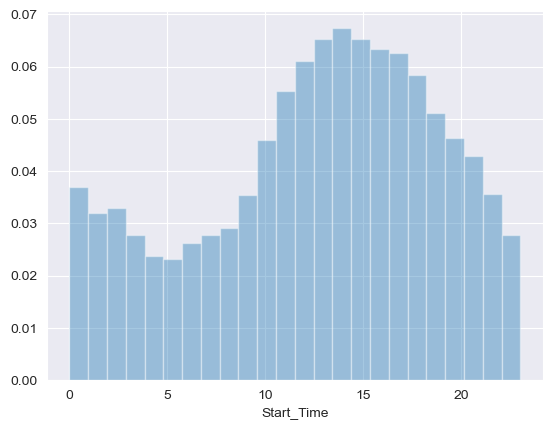

In [74]:
# Now check day vs percentage of accidents
sns.distplot(sundays_start_time.dt.hour, bins = 24,kde=False, norm_hist=True);

/var/folders/1q/97slxf2n6bv2jwc9z0pm2jch0000gn/T/ipykernel_3005/3197362350.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(mondays_start_time.dt.hour, bins = 24,kde=False, norm_hist=True);


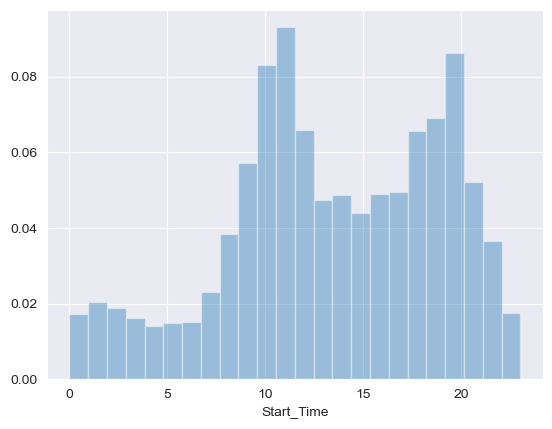

In [128]:
mondays_start_time = df.Start_Time[df.Start_Time.dt.dayofweek == 0]
sns.distplot(mondays_start_time.dt.hour, bins = 24,kde=False, norm_hist=True);

On Sundays , the Peak occurs between 1 pm to 4 pm unlike weekdays

/var/folders/1q/97slxf2n6bv2jwc9z0pm2jch0000gn/T/ipykernel_1209/2589849299.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df.Start_Time.dt.month, bins = 12,kde=False, norm_hist=True);


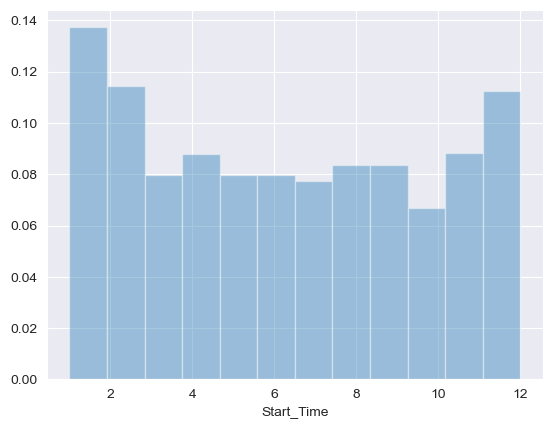

In [75]:
# Month
sns.distplot(df.Start_Time.dt.month, bins = 12,kde=False, norm_hist=True);

Explain the Month wise trend, why there is more accident in winter?


In [76]:
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,Street,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-6925260,Source1,2,2021-01-01 00:00:00,2021-01-01 01:38:42,30.384298,-91.064819,0.229,Incident on SIEGEN LN near N RIEGER RD Expect ...,Siegen Ln,...,False,False,False,False,True,False,Night,Night,Night,Night
1,A-6641766,Source1,2,2021-01-01 00:00:01,2021-01-01 01:22:27,35.901771,-78.656364,0.026,Incident on STRICKLAND RD near HOUSE 9600 Driv...,Strickland Rd,...,False,False,True,False,False,False,Night,Night,Night,Night
2,A-6948267,Source1,2,2021-01-01 00:00:01,2021-01-01 01:22:27,35.901771,-78.656364,0.026,Incident on STRICKLAND RD near HOUSE 9600 Driv...,Strickland Rd,...,False,False,True,False,False,False,Night,Night,Night,Night
3,A-6775069,Source1,2,2021-01-01 00:00:01,2021-01-01 01:36:56,32.559486,-96.822895,0.853,Incident on I-35E SB near BEAR CREEK RD Drive ...,S Beckley Rd,...,False,False,False,False,False,False,Night,Night,Night,Night
4,A-6968205,Source1,2,2021-01-01 00:01:00,2021-01-01 01:40:14,38.018757,-121.947351,0.309,Incident on CA-4 EB near BAILEY RD Drive with ...,CA-4 E,...,False,False,False,False,False,False,Night,Night,Night,Night


/var/folders/1q/97slxf2n6bv2jwc9z0pm2jch0000gn/T/ipykernel_1209/341436843.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df_2016.Start_Time.dt.month, bins = 12,kde=False, norm_hist=True);


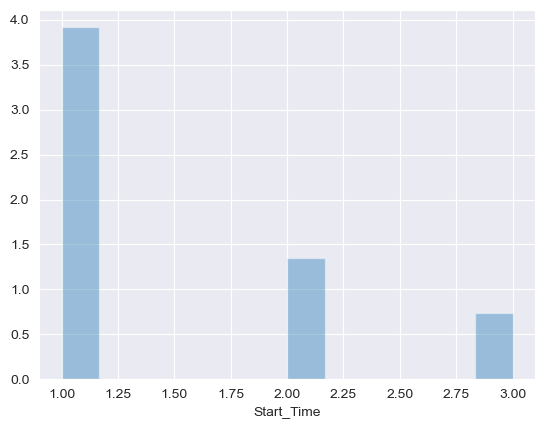

In [79]:
df_2016 = df[df.Start_Time.dt.year == 2023]
sns.distplot(df_2016.Start_Time.dt.month, bins = 12,kde=False, norm_hist=True);

In [80]:
df.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Description,Street,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-6925260,Source1,2,2021-01-01 00:00:00,2021-01-01 01:38:42,30.384298,-91.064819,0.229,Incident on SIEGEN LN near N RIEGER RD Expect ...,Siegen Ln,...,False,False,False,False,True,False,Night,Night,Night,Night
1,A-6641766,Source1,2,2021-01-01 00:00:01,2021-01-01 01:22:27,35.901771,-78.656364,0.026,Incident on STRICKLAND RD near HOUSE 9600 Driv...,Strickland Rd,...,False,False,True,False,False,False,Night,Night,Night,Night
2,A-6948267,Source1,2,2021-01-01 00:00:01,2021-01-01 01:22:27,35.901771,-78.656364,0.026,Incident on STRICKLAND RD near HOUSE 9600 Driv...,Strickland Rd,...,False,False,True,False,False,False,Night,Night,Night,Night
3,A-6775069,Source1,2,2021-01-01 00:00:01,2021-01-01 01:36:56,32.559486,-96.822895,0.853,Incident on I-35E SB near BEAR CREEK RD Drive ...,S Beckley Rd,...,False,False,False,False,False,False,Night,Night,Night,Night
4,A-6968205,Source1,2,2021-01-01 00:01:00,2021-01-01 01:40:14,38.018757,-121.947351,0.309,Incident on CA-4 EB near BAILEY RD Drive with ...,CA-4 E,...,False,False,False,False,False,False,Night,Night,Night,Night


<Axes: ylabel='count'>

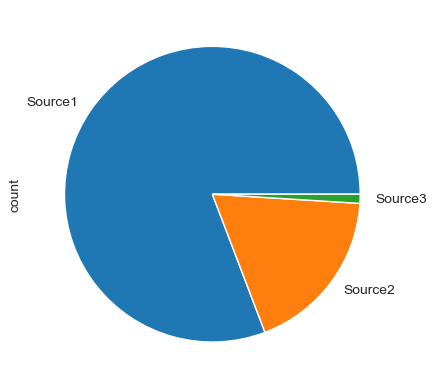

In [82]:
# Check the percentage of data we are getinng from different Source
df.Source.value_counts().plot(kind = 'pie')

## Start Latitude and Longitude

In [83]:
df.Start_Lat

0          30.384298
1          35.901771
2          35.901771
3          32.559486
4          38.018757
             ...    
3572833    32.909061
3572834    42.959427
3572835    38.361154
3572836    34.068219
3572837    42.419172
Name: Start_Lat, Length: 3572838, dtype: float64

In [84]:
df.Start_Lng

0          -91.064819
1          -78.656364
2          -78.656364
3          -96.822895
4         -121.947351
              ...    
3572833    -96.732217
3572834    -85.672227
3572835   -121.970167
3572836   -117.384067
3572837    -83.088509
Name: Start_Lng, Length: 3572838, dtype: float64

<Axes: xlabel='Start_Lng', ylabel='Start_Lat'>

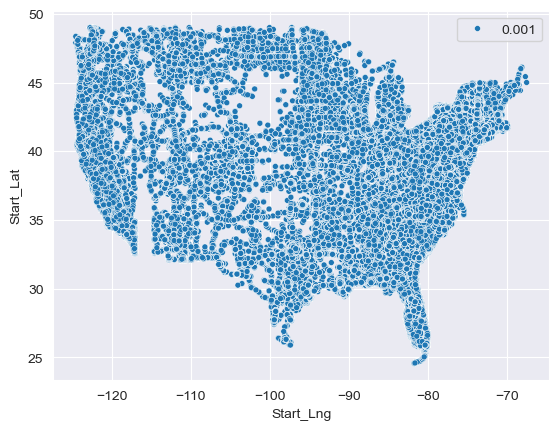

In [85]:
sns.scatterplot(x = df.Start_Lng , y = df.Start_Lat, size = 0.001)

In [87]:
lat , lon = df.Start_Lat[0], df.Start_Lng[0]
lat , lon

(30.384298, -91.064819)

In [88]:
# Take a sample dataset of 20% of our data , otherwise it'll take longer time
df_sample = df.sample(frac=0.1)
len(df_sample)

357284

In [97]:
# Lets zip the Latitude and Longitude

zipped_Lat_Lng = zip(list(df_sample.Start_Lat),list(df_sample.Start_Lng))

In [98]:
# Lets create it on Map
map = folium.Map()
HeatMap(zipped_Lat_Lng).add_to(map)
map

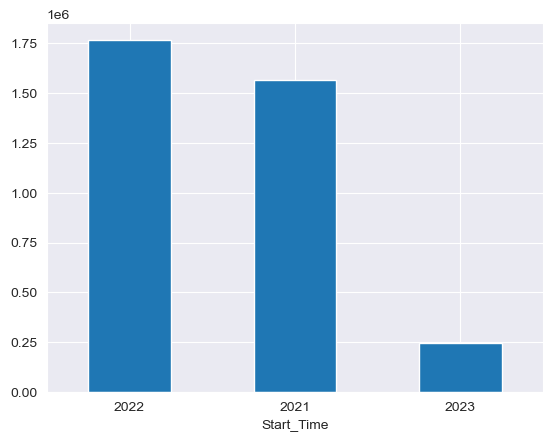

In [104]:
#Year on Year Accident Trend
df.Start_Time.dt.year.value_counts().plot(kind = 'bar')
plt.xticks(rotation = 0)
plt.show()

### So the year on year number of accidents is decresing, keep in mind we have less data for year 2023, if we get full data the figure might change

## Ask and Answer Questions 

1. Are there more accidents in warmer or colder areas? 
2. Which 5 states have the highest number of accidents? How about per Capita # *ANSWERED*
3. Does New York show up in the data? if yes, why is the count lower if this the most populated city. - *ANSWERED*
4. Among the top 100 cities in number of accidents , which states do they belong to most frequently.
5. What time of the day are accidents most frequent in? - *ANSWERED*
6. which days of the week hae the most accident? - *ANSWERED*
7. Which of the months have the most accidents? - *ANSWERED*
8. What is the trend of accidents year on year(Decreasing / Increasing)? - *ANSWERED*
9. When is accidents per unit of traffic is higher?

### Summary and Conclusion

Insights:
- No data for NewYork
- Lesss Than 5% Cities have more than 1000 Yearly accidents
- No of accidents per city decreases exponentially
- over 860 cities have reported just one accident(need to investigate)